In [1]:
import cv2
from matplotlib import pyplot as plt
import numpy as np

In [2]:
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(40, 30))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title(), color='black')
        plt.imshow(image, cmap='gray', vmin=0, vmax=255)
    plt.show()

In [3]:
image_h_c = cv2.imread('image_high_contrast.jpg', 0)
image_l_c = cv2.imread('image_low_contrast.jpg', 0)
image_h_d = cv2.imread('image_high_detalized.jpg', 0)
image_l_d = cv2.imread('image_low_detalized.jpg', 0)

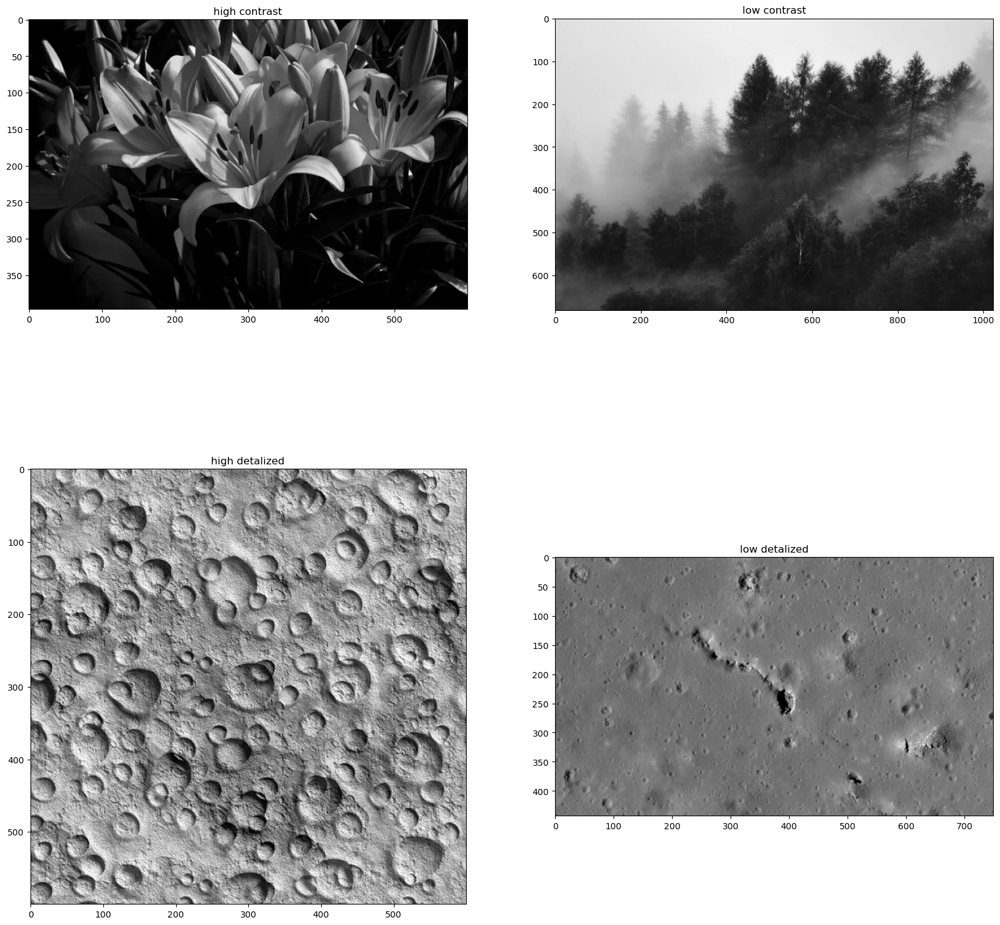

In [4]:
plt.figure(figsize=(20, 20))
plt.subplot(221)
plt.title('high contrast')
plt.imshow(image_h_c, cmap='gray', )
plt.subplot(222)
plt.title('low contrast')
plt.imshow(image_l_c, cmap='gray', )
plt.subplot(223)
plt.title('high detalized')
plt.imshow(image_h_d, cmap='gray', )
plt.subplot(224)
plt.title('low detalized')
plt.imshow(image_l_d, cmap='gray')
plt.show()

## Histogram shifting

In [5]:
def histogram_shift_left(image_gray, shift_value=0):
    out = np.copy(image_gray).astype(np.int32)
    out = out - shift_value
    out[out < 0] = 0
    return out.astype(np.uint8)

In [6]:
def plot_histogram(image_gray, title="Histogram"):
    plt.xlim([0, 256])
    histogram, bin_edges = np.histogram(
        image_gray[:, :], bins=256, range=(0, 256)
    )

    plt.plot(bin_edges[0:-1], histogram, color='red')

    plt.title(title)
    plt.xlabel("value")
    plt.ylabel("Pixel count")

In [7]:
image_dict = {
    'image high contrast' : image_h_c,
    'image low contrast' : image_l_c,
    'image high detalized' : image_h_d,
    'image low detalized' : image_l_d 
}

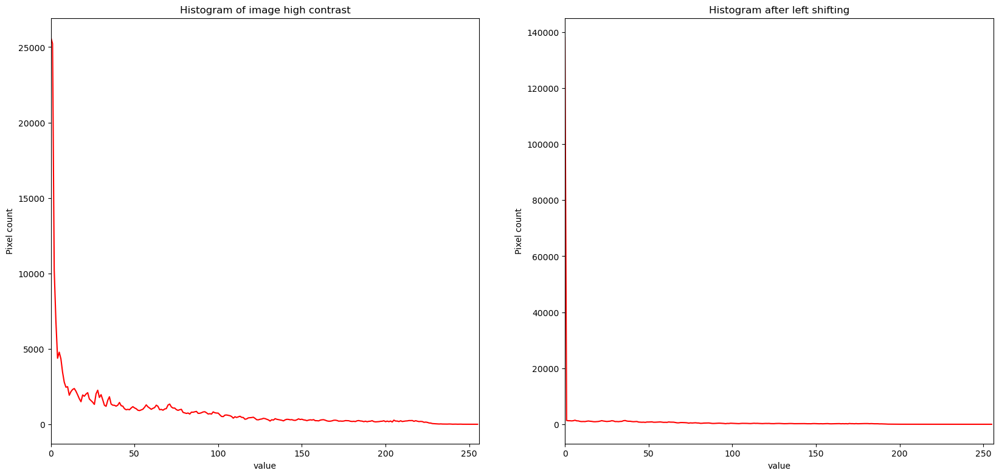

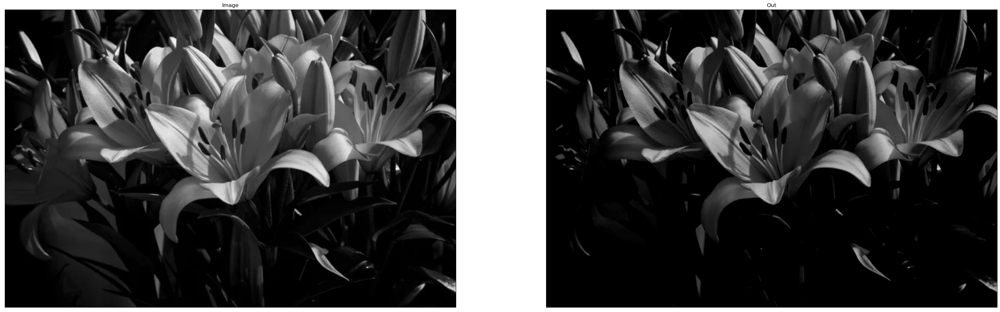

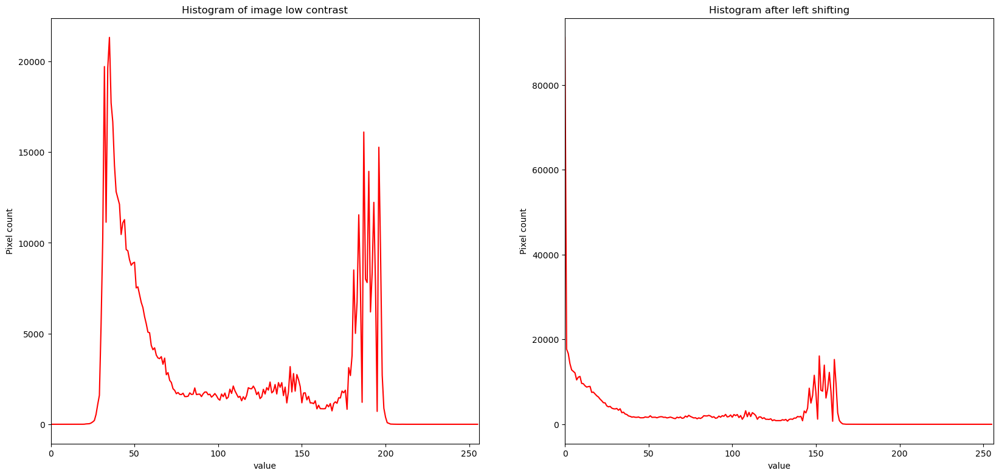

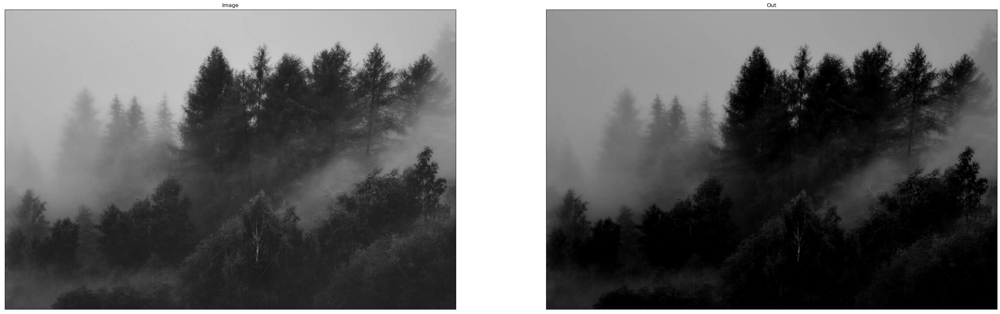

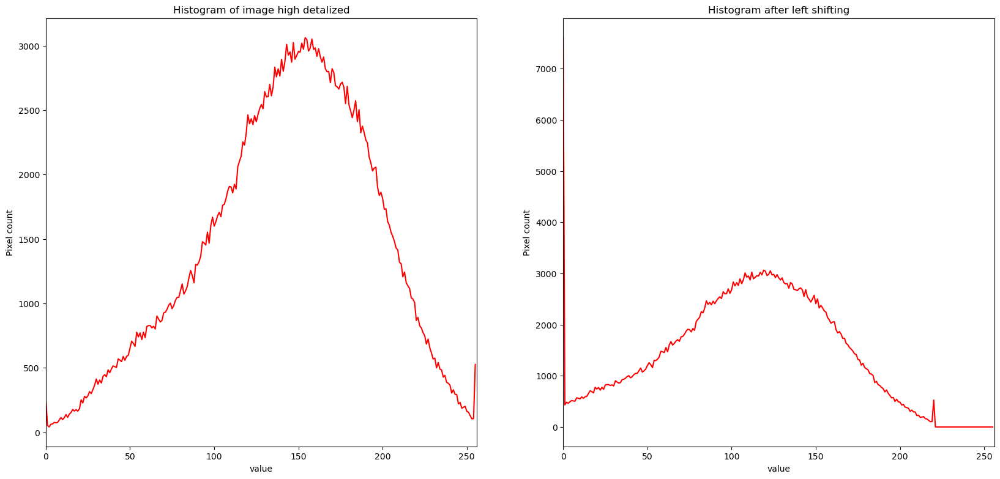

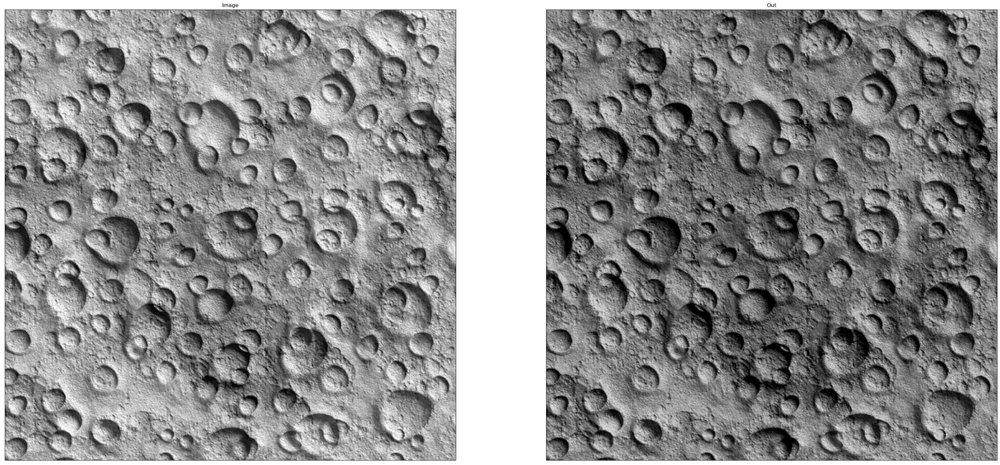

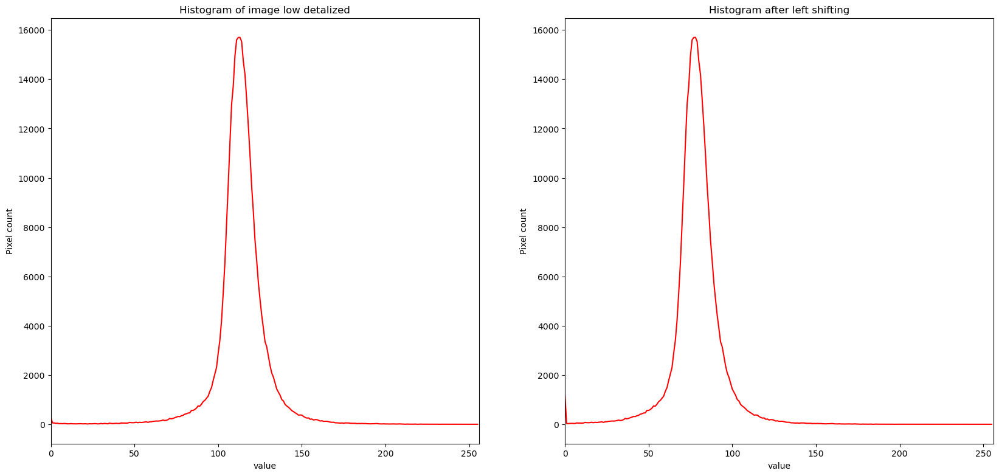

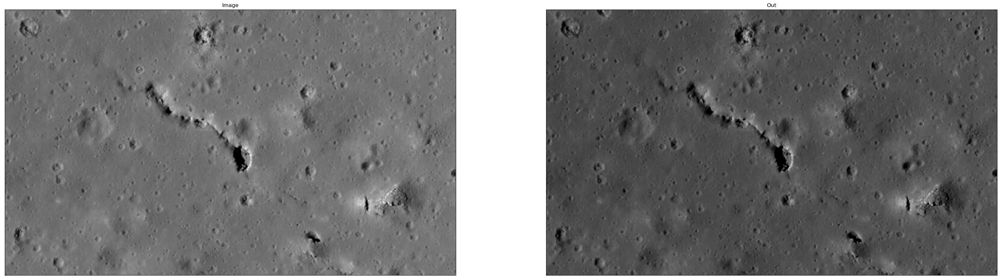

In [8]:
for name, img in image_dict.items():
    plt.figure(figsize=(20, 20))

    plt.subplot(221)
    plot_histogram(img, f"Histogram of {name}")

    plt.subplot(222)
    out = histogram_shift_left(img, 35)
    plot_histogram(out, "Histogram after left shifting")

    visualize(image=img, out=out)